In [256]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly
from sklearn.preprocessing import StandardScaler
from scipy.spatial import distance
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import copy
import warnings
warnings.filterwarnings("ignore")
plotly.offline.init_notebook_mode (connected = True)
from plotly.subplots import make_subplots
import random



In [257]:
data=pd.read_csv("Data/genres_v2.csv")

In [258]:
data = data.drop(['type','uri','track_href','analysis_url','id','Unnamed: 0','title'],axis=1)


Exploratory Data Analysis

In [259]:
#Exploratory data analysis
#corr plot with heat map
x=list(data.corr().columns)
y=list(data.corr().index)
values=np.array(data.corr().values)
fig = go.Figure(data=go.Heatmap(
    z=values,
    x=x,
    y=y,
                   
    
                   hoverongaps = False))
fig.show()

<AxesSubplot:>

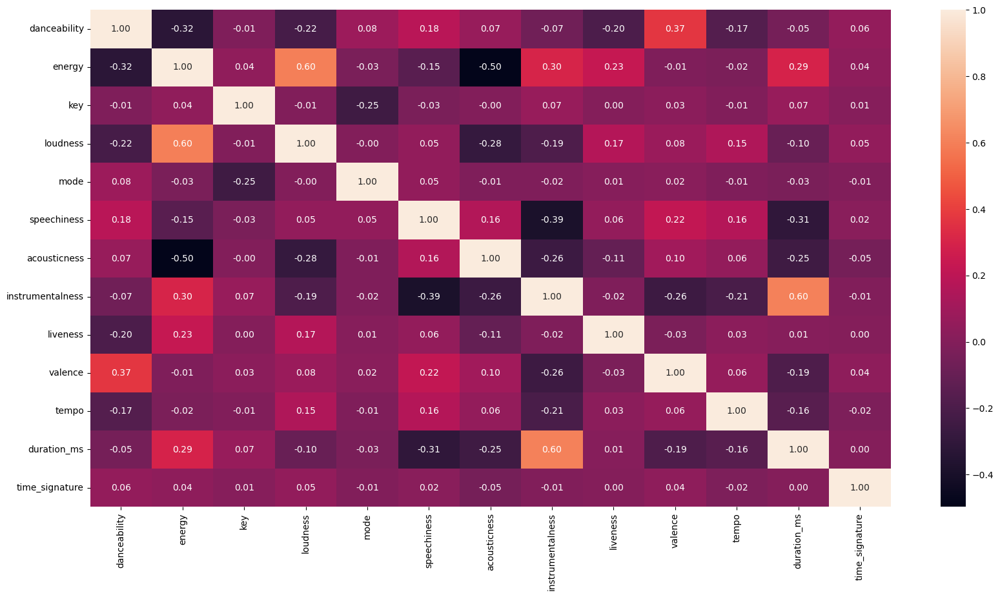

In [260]:
# With annotation
plt.figure(figsize=(20,10))
sns.heatmap(data.corr(), annot=True, fmt='.2f')

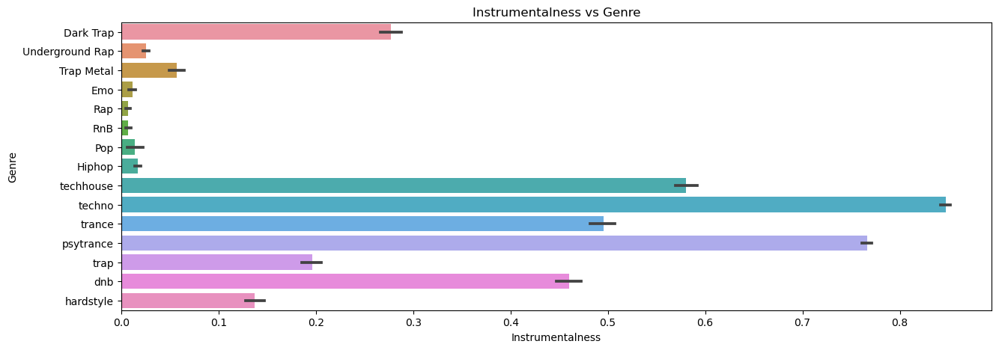

In [261]:
#Further exploratory data analysis
#seeing how each of the variables compare against genre to see how they are different in each of the genres
#we can see instrumentalness varies a lot in each of the genres
plt.figure(figsize=(15,5))
sns.barplot(x='instrumentalness',y='genre',data=data)
plt.title('Instrumentalness vs Genre')
plt.xlabel('Instrumentalness')
plt.ylabel('Genre')
plt.show()

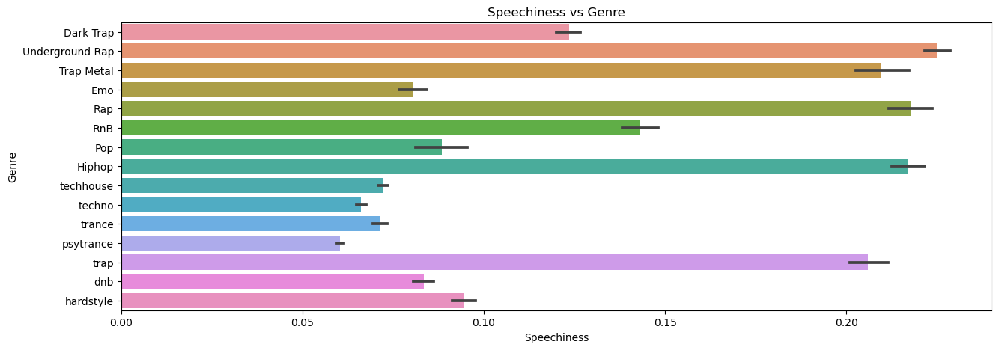

In [262]:
#seeing how speechiness varies in each of the genres
plt.figure(figsize=(15,5))
sns.barplot(x='speechiness',y='genre',data=data)
plt.title('Speechiness vs Genre')
plt.xlabel('Speechiness')
plt.ylabel('Genre')
plt.show()

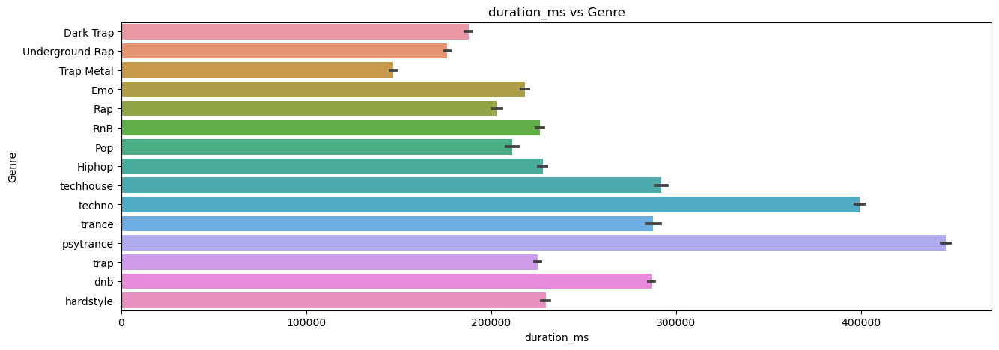

In [263]:
#seeing how duration_ms varies in each of the genres
plt.figure(figsize=(15,5))
sns.barplot(x='duration_ms',y='genre',data=data)
plt.title('duration_ms vs Genre')
plt.xlabel('duration_ms')
plt.ylabel('Genre')
plt.show()

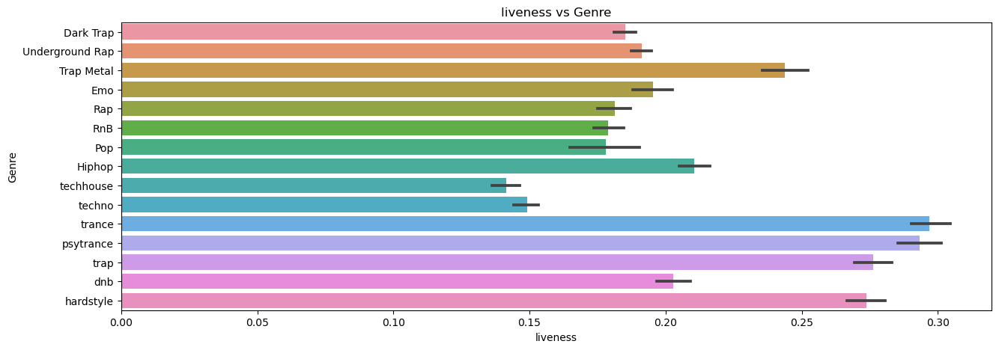

In [264]:
#seeing how liveness varies in each of the genres
plt.figure(figsize=(15,5))
sns.barplot(x='liveness',y='genre',data=data)
plt.title('liveness vs Genre')
plt.xlabel('liveness')
plt.ylabel('Genre')
plt.show()

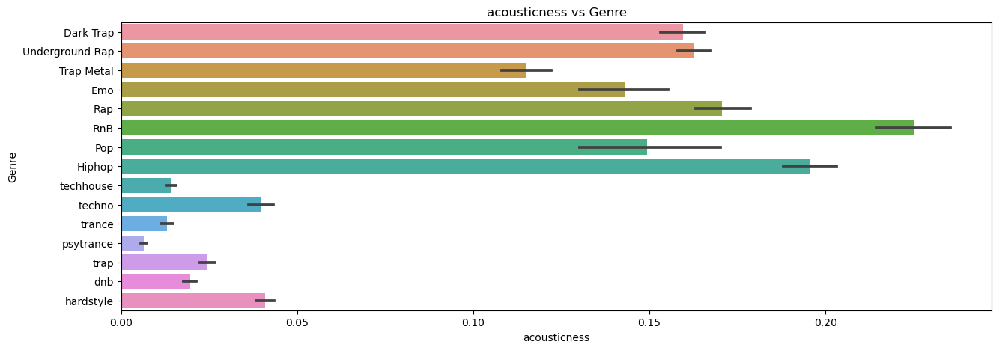

In [265]:
#seeing how acousticness varies in each of the genres
plt.figure(figsize=(15,5))
sns.barplot(x='acousticness',y='genre',data=data)
plt.title('acousticness vs Genre')
plt.xlabel('acousticness')
plt.ylabel('Genre')
plt.show()

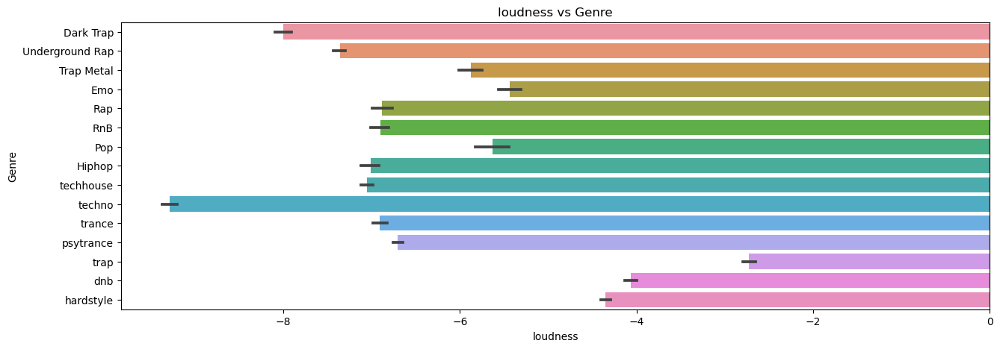

In [266]:
#seeing how loudness varies in each of the genres
plt.figure(figsize=(15,5))
sns.barplot(x='loudness',y='genre',data=data)
plt.title('loudness vs Genre')
plt.xlabel('loudness')
plt.ylabel('Genre')
plt.show()

In [267]:
#How the features are distributed. This will help us understand that some of the features are skewed and some are normally distributed
features = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']
rows = 3
cols = 4
fig = make_subplots(rows=rows, cols=cols, subplot_titles=features)
x, y = np.meshgrid(np.arange(rows)+1, np.arange(cols)+1)
count  = 0
for row, col in zip(x.T.reshape(-1), y.T.reshape(-1)):
    fig.add_trace(
        go.Histogram(x = data[features[count]].values),
        row = row,
        col = col
    )
    count+=1
    
fig.update_layout(height=900, width=900, title_text='Feature Distribution', showlegend=False)
fig.show()

Data preparation

In [268]:
#removing rows that don't have a song_name
data=data.dropna(subset=['song_name'])

In [269]:
# Creating a new dataframe to scale and use for modelling
df=data.copy()

In [270]:
#scaling the data - important for preprocessing
x=df[df.drop(columns=['song_name','genre']).columns].values
scaler = StandardScaler().fit(x)
X_scaled = scaler.transform(x)
df[df.drop(columns=['song_name','genre']).columns]=X_scaled

K-means Model for predicting and the recommender system (high #clusters, all features)

In [271]:
df.drop('genre', inplace=True, axis=1)
df.drop('song_name', inplace=True, axis=1)

range_n_clusters = [2, 4, 8, 16, 50, 200, 600, 1500, 3000]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    # we are using all the features, becuase we tried with specified features but the model did better with all features
    kmeans.fit(df)
    
    # labelling the clusters
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(df, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))
    
    #Results with all features
    #For n_clusters=8, the silhouette score is 0.09848699420311324
    #For n_clusters=2200, the silhouette score is 0.14385713367758782
    #For n_clusters=3000, the silhouette score is 0.16384999918351992
    # For n_clusters=5000, the silhouette score is 0.20378558624145543
    
    #with specified features:
    # using the EDA done above helps us choose important features for our kmeans model.
    # The reasoning for how we chose our features are based on the corr plots, bar graphs, feature distribution
    # We don't want to neccesarily choose 2 correlated features (since they will have a similar output)
    # The plots of some of feautres against genre also helped us identify more important/varying features
    # The feature distribution also helps us identify how the features are distributed
    # kmeans.fit(df[["loudness", "speechiness", "instrumentalness", "liveness", "acousticness"]])
    
    #Results with specified features:
    # For n_clusters=2, the silhouette score is 0.2327318970691633
    # For n_clusters=4, the silhouette score is 0.10830800816806557
    # For n_clusters=6, the silhouette score is 0.07614194067295406
    # For n_clusters=8, the silhouette score is 0.06632382977493056
    # For n_clusters=12, the silhouette score is 0.053108606163406874
    # For n_clusters=16, the silhouette score is 0.03737034398796106
    # For n_clusters=22, the silhouette score is 0.031800318348427385
    # For n_clusters=32, the silhouette score is 0.02138774546047285
    # For n_clusters=64, the silhouette score is 0.006626597191108074
    
    #the closer the silhouette score to 1, the better it is!

For n_clusters=2, the silhouette score is 0.10872386421634558
For n_clusters=4, the silhouette score is 0.10405745160095514
For n_clusters=8, the silhouette score is 0.09887561420848742
For n_clusters=16, the silhouette score is 0.09047523065087087


In [272]:
kmeans = KMeans(n_clusters=2000, max_iter=100)
kmeans.fit(df)

KMeans(max_iter=100, n_clusters=2000)

In [273]:
cluster_labels = kmeans.labels_

In [275]:
###############################################################################################
#                 RECOMMENDER SYSTEM IMPLEMENTATION BASED ON ALL FEATURES                     #
###############################################################################################

# We create a dataframe that will contain every song name and its corresponding cluster label.
clusterdfkmeans = pd.DataFrame()

clusterdfkmeans['song_name'] = data['song_name']
clusterdfkmeans['cluster_label'] = cluster_labels

# We ask the user to enter the name of the song they want our recommendations to be based on. 
a=str(input('Please enter the name of the song :'))

# We ask the user how many song recommendations they want.
b=int(input('Please enter the number of recommendations you want: '))

# We find the cluster label of the song the user selected.
clusterval = clusterdfkmeans[clusterdfkmeans.song_name == a].iloc[0]['cluster_label']

# We select every song within that cluster
songs_in_cluster = clusterdfkmeans.loc[clusterdfkmeans['cluster_label'] == clusterval]

# We calculate the size of the cluster to be used in our random number generator to make
# a random recommendation of a song within the cluster.
cluster_size = int(clusterdfkmeans.loc[clusterdfkmeans['cluster_label'] == clusterval].shape[0])

# resetting index
clusterdfkmeans.reset_index

# intializing list of random indeces so that no random index is chosen more than once.
random_indeces = []

# In a for loop we make as many song recommedations as the user requested by randomly 
# picking that many songs within the cluster. This method ensures recommended songs
# are never repeated.
for i in range(0, b):    
    random_index = random.randint(0,cluster_size)
    if random_index not in random_indeces:
        print(songs_in_cluster.iloc[[random_index]])
        random_indeces.append(random_index)
    else:
        i=-1
    

           song_name  cluster_label
10193  When I'm Gone            754
      song_name  cluster_label
21342      Gold            754
                        song_name  cluster_label
14094  Ballin' (with Roddy Ricch)            754
              song_name  cluster_label
2255  TheArtOfCremation            754
      song_name  cluster_label
18367    Issues            754
              song_name  cluster_label
7295  TheArtOfCremation            754


Visualizations below (with fewer clusters and specific features for better visualization)

In [276]:
kmeans = KMeans(n_clusters=5, max_iter=100)
kmeans.fit(df[["loudness", "speechiness", "instrumentalness", "liveness", "acousticness"]])

KMeans(max_iter=100, n_clusters=5)

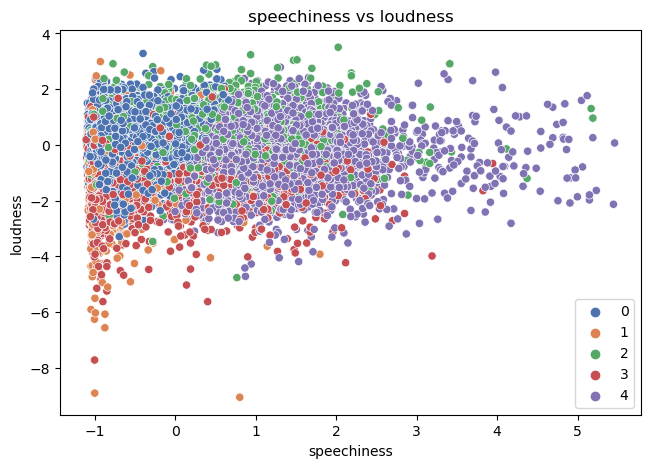

In [277]:
plt.figure(figsize=(7.5,5))
sns.scatterplot(x = 'speechiness',y = 'loudness', data = df, hue = kmeans.labels_,palette='deep')
plt.title('speechiness vs loudness')
plt.xlabel('speechiness')
plt.ylabel('loudness')
plt.show()

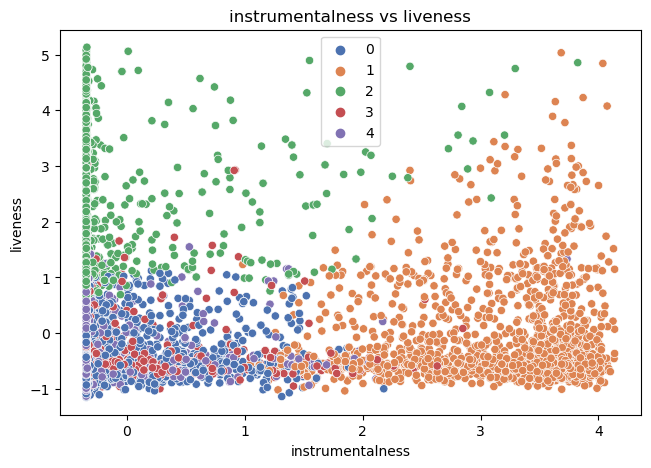

In [278]:
plt.figure(figsize=(7.5,5))
sns.scatterplot(x = 'instrumentalness',y = 'liveness', data = df, hue = kmeans.labels_,palette='deep')
plt.title('instrumentalness vs liveness')
plt.xlabel('instrumentalness')
plt.ylabel('liveness')
plt.show()

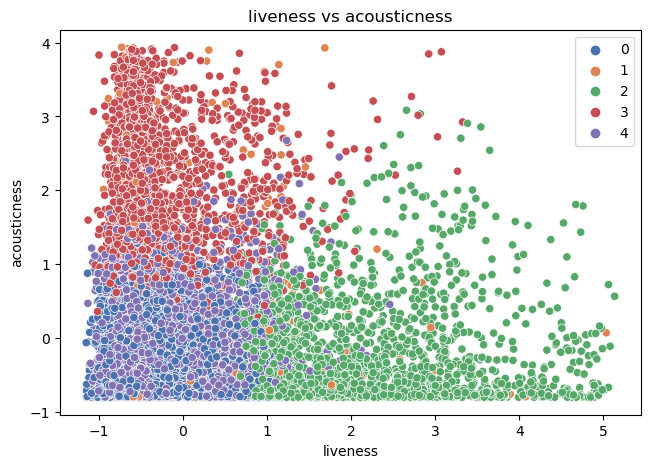

In [279]:
plt.figure(figsize=(7.5,5))
sns.scatterplot(x = 'liveness',y = 'acousticness', data = df, hue = kmeans.labels_,palette='deep')
plt.title('liveness vs acousticness')
plt.xlabel('liveness')
plt.ylabel('acousticness')
plt.show()

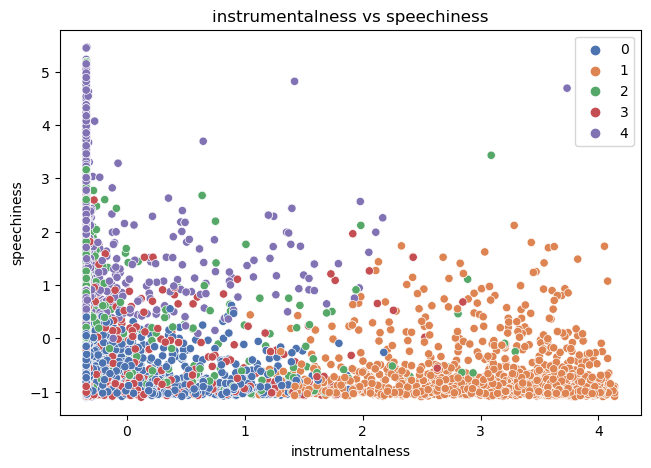

In [280]:
plt.figure(figsize=(7.5,5))
sns.scatterplot(x = 'instrumentalness',y = 'speechiness', data = df, hue = kmeans.labels_,palette='deep')
plt.title('instrumentalness vs speechiness')
plt.xlabel('instrumentalness')
plt.ylabel('speechiness')
plt.show()

Hierarchial clustering model and recommendation system - Alternate. According to evaluation this was slightly better

In [283]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

###############################################################################################
#                                      DATA CLEAN-UP                                          #
###############################################################################################

#initializing scaler object
scaler = StandardScaler()

#importing that data
unmergedspotifydf = pd.read_csv("Data/genres_v2.csv")

# get the dummies and store it in a variable
dummies = pd.get_dummies(unmergedspotifydf.genre)

# Concatenate the dummies to original dataframe
spotifydf2 = pd.concat([unmergedspotifydf, dummies], axis='columns')

# drop the values
spotifydf = spotifydf2.drop(['type', 'id', 'uri', 'track_href', 'analysis_url', 'Unnamed: 0', 'title'], axis='columns')

# Removing rows that don't have a song_name
spotifydf = spotifydf.dropna(subset=['song_name'])


In [284]:
###############################################################################################
#                Preparing Dataframes for Model that includes ALL features                    #
###############################################################################################

# df of select features
selectdf = spotifydf.drop(['song_name', 'genre'], axis='columns')

# Selecting features for later use in our model
x = selectdf.values

# Scaling the features
scaled_features = scaler.fit_transform(x)

# Making a dataframe from the scaled features
scaled_features_df = pd.DataFrame(scaled_features, index=selectdf.index, columns=selectdf.columns)

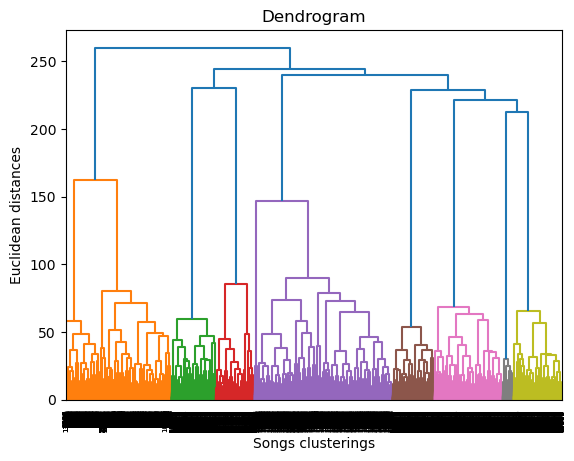

In [285]:
###############################################################################################
#                        DENDROGRAM FOR CLUSTERING WITH ALL FEATURES                          #
###############################################################################################

# We generate a dendrogram for our clustering model to derive our optimal number of clusters 

import scipy.cluster.hierarchy as sch # importing scipy.cluster.hierarchy for dendrogram
dendrogram = sch.dendrogram(sch.linkage(scaled_features_df, method = 'ward')) # finding the optimal number of clusters using dendrogram
plt.title('Dendrogram') # title of the dendrogram
plt.xlabel('Songs clusterings') # label of the x-axis
plt.ylabel('Euclidean distances') # label of the y-axis
plt.show()

In [286]:
###############################################################################################
#                         CREATING OUR MODEL BASED ON ALL FEATURES                            #
###############################################################################################

# 16 clusters is optimal for our dataset that includes all numerical scaled features, as shown by the dendogram above

from sklearn.cluster import AgglomerativeClustering
import random

# We instantiate a hierarchical clustering object and set clusters to 16, the optimal number of clusters we derived from our dendogram.
Agg_hc = AgglomerativeClustering(n_clusters = 16, affinity = 'euclidean', linkage = 'ward')

# We run our clustering model on our scaled features dataframe.
y_hc = Agg_hc.fit_predict(scaled_features_df)

# We extract the cluster label for every data point that our clustering model assigned.
data_labels = Agg_hc.labels_

# We create a dataframe that will contain every song name and its corresponding cluster label.
clusterdf = pd.DataFrame()
clusterdf['song_name'] = spotifydf['song_name']
clusterdf['cluster_label'] = data_labels

In [287]:
###############################################################################################
#                 RECOMMENDER SYSTEM IMPLEMENTATION BASED ON ALL FEATURES                     #
###############################################################################################

# We ask the user to enter the name of the song they want our recommendations to be based on. 
a=str(input('Please enter the name of the song :'))

# We ask the user how many song recommendations they want.
b=int(input('Please enter the number of recommendations you want: '))

# We find the cluster label of the song the user selected.
clusterval = clusterdf[clusterdf.song_name == a].iloc[0]['cluster_label']

# We select every song within that cluster
songs_in_cluster = clusterdf.loc[clusterdf['cluster_label'] == clusterval]

# We calculate the size of the cluster to be used in our random number generator to make
# a random recommendation of a song within the cluster.
cluster_size = int(clusterdf.loc[clusterdf['cluster_label'] == clusterval].shape[0])

# resetting index for selected songs
songs_in_cluster.reset_index

# intializing list of random indeces so that no random index is chosen more than once.
random_indeces = []

# In a for loop we make as many song recommedations as the user requested by randomly 
# picking that many songs within the cluster. This method ensures recommended songs
# are never repeated.
for i in range(0, b):    
    random_index = random.randint(0,cluster_size)
    if random_index not in random_indeces:
        print(songs_in_cluster.iloc[[random_index]])
        random_indeces.append(random_index)
    else:
        i-=1
    

      song_name  cluster_label
18354        22              7
                    song_name  cluster_label
18172  As Long As You Love Me              7
         song_name  cluster_label
18067  Complicated              7
      song_name  cluster_label
18438   Circles              7
                 song_name  cluster_label
18491  All About That Bass              7
                    song_name  cluster_label
18397  Mood (feat. iann dior)              7
                             song_name  cluster_label
18441  Beautiful People (feat. Khalid)              7


Text(0.5, 1.0, 'Labeled Song Clusterings')

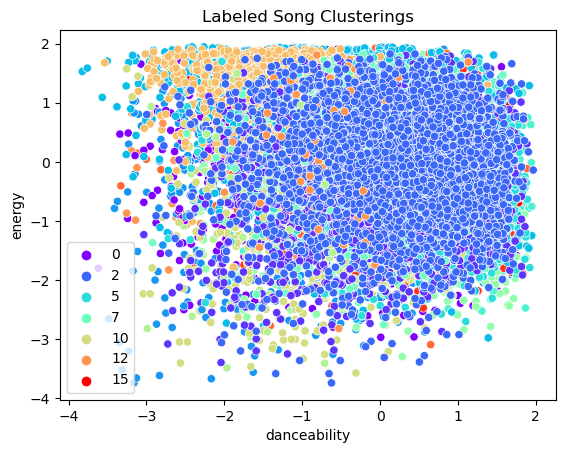

In [288]:
import seaborn as sns
sns.scatterplot(x='danceability', 
                y='energy', 
                data=scaled_features_df, 
                hue=data_labels,
                palette="rainbow").set_title('Labeled Song Clusterings')

Text(0.5, 1.0, 'Labeled Song Clusterings')

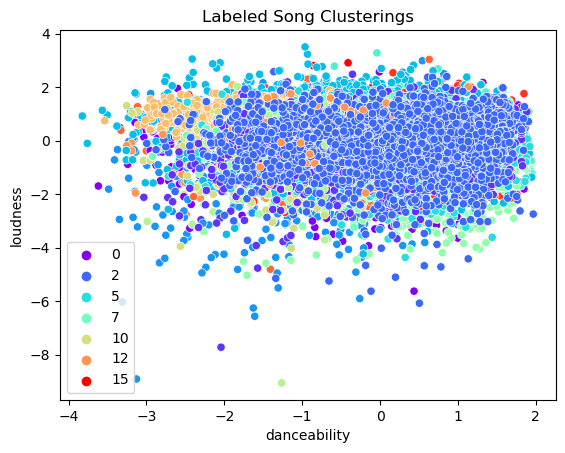

In [289]:
sns.scatterplot(x='danceability', 
                y='loudness', 
                data=scaled_features_df, 
                hue=data_labels,
                palette="rainbow").set_title('Labeled Song Clusterings')

Text(0.5, 1.0, 'Labeled Song Clusterings')

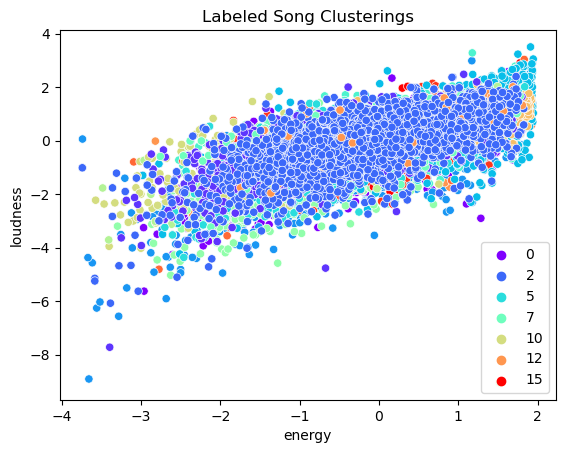

In [290]:
sns.scatterplot(x='energy', 
                y='loudness', 
                data=scaled_features_df, 
                hue=data_labels,
                palette="rainbow").set_title('Labeled Song Clusterings')

In [291]:
# Silhouette score for Hierarchical Clustering without feature selection

print(silhouette_score(scaled_features_df, data_labels))

0.17682516446979885


Selected features model - BETTER FOR VISUALIZATIONS

In [292]:
###############################################################################################
#                 Preparing Dataframes for Model WITH SELECTED features                       #
###############################################################################################

# Selecting features for later use in our model
#The reasoning for selection here is the same as for the kmeans models
x = selectdf[['loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness']].values

# Scaling the features
scaled_features = scaler.fit_transform(x)

# Making a dataframe that only includes our selected features.
selectdf = spotifydf[['loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness']]

# Making a dataframe from our selected scaled features.
scaled_features_df = pd.DataFrame(scaled_features, index=selectdf.index, columns=selectdf.columns)


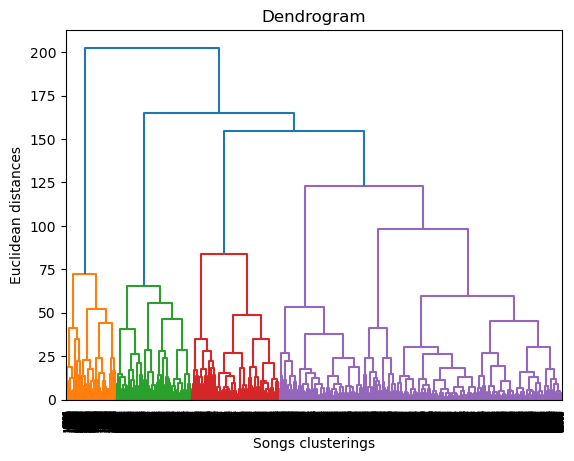

In [293]:
###############################################################################################
#                    DENDROGRAM FOR CLUSTERING WITH SELECTED FEATURES                         #
###############################################################################################

# We generate a dendrogram for our clustering model to derive our optimal number of clusters 

dendrogram = sch.dendrogram(sch.linkage(scaled_features_df, method = 'ward'))
plt.title('Dendrogram') # title of the dendrogram
plt.xlabel('Songs clusterings') # label of the x-axis
plt.ylabel('Euclidean distances') # label of the y-axis
plt.show()

In [294]:
###############################################################################################
#                      CREATING OUR MODEL BASED ON SELECTED FEATURES                          #
###############################################################################################

# 18 clusters is optimal for our dataset that includes all numerical scaled features, as shown by the dendogram above

# We instantiate a hierarchical clustering object and set clusters to 18, the optimal number of clusters we derived from our dendogram.
Agg_hc = AgglomerativeClustering(n_clusters = 18, affinity = 'euclidean', linkage = 'ward')

# We run our clustering model on our scaled features dataframe.
y_hc = Agg_hc.fit_predict(scaled_features_df)

# We extract the cluster label for every data point that our clustering model assigned.
data_labels = Agg_hc.labels_

# We create a dataframe that will contain every song name and its corresponding cluster label.
clusterdf = pd.DataFrame()

clusterdf['song_name'] = pd.Series(spotifydf['song_name'])
clusterdf['cluster_label'] = pd.Series(data_labels)

Text(0.5, 1.0, 'Labeled Song Clusterings')

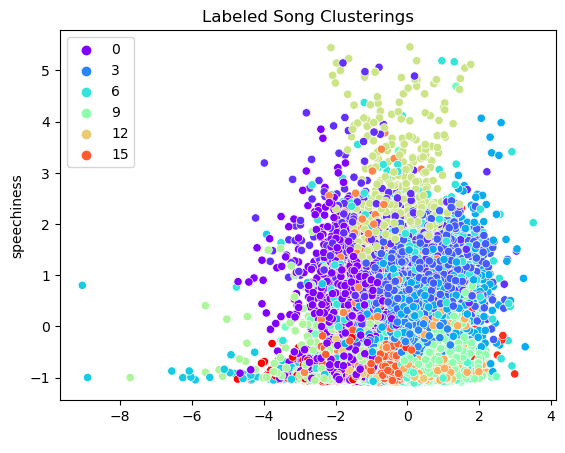

In [295]:
sns.scatterplot(x='loudness', 
                y='speechiness', 
                data=scaled_features_df, 
                hue=data_labels,
                palette="rainbow").set_title('Labeled Song Clusterings')

Text(0.5, 1.0, 'Labeled Song Clusterings')

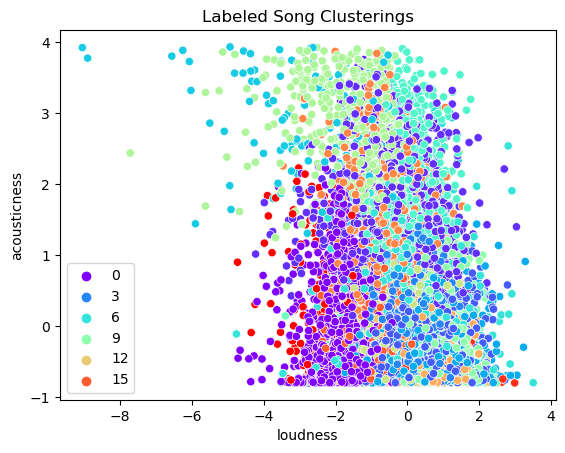

In [296]:
sns.scatterplot(x='loudness', 
                y='acousticness', 
                data=scaled_features_df, 
                hue=data_labels,
                palette="rainbow").set_title('Labeled Song Clusterings')

Text(0.5, 1.0, 'Labeled Song Clusterings')

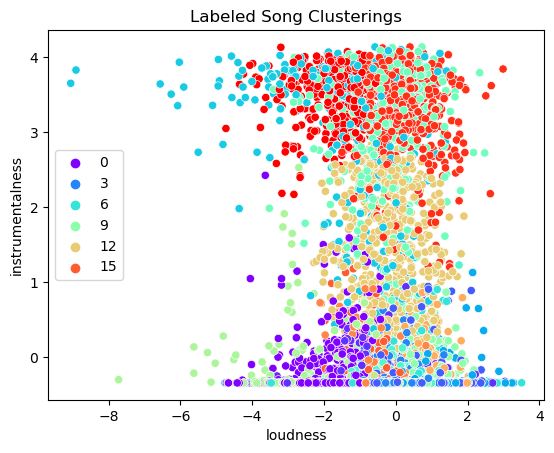

In [297]:
sns.scatterplot(x='loudness', 
                y='instrumentalness', 
                data=scaled_features_df, 
                hue=data_labels,
                palette="rainbow").set_title('Labeled Song Clusterings')

Text(0.5, 1.0, 'Labeled Song Clusterings')

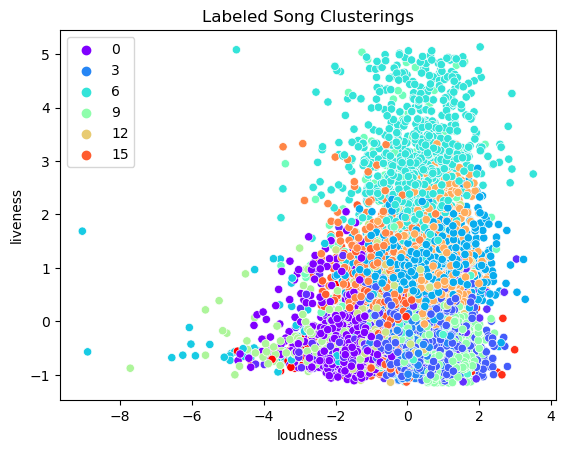

In [298]:
sns.scatterplot(x='loudness', 
                y='liveness', 
                data=scaled_features_df, 
                hue=data_labels,
                palette="rainbow").set_title('Labeled Song Clusterings')

In [299]:

# Silhouette score for Hierarchical Clustering WITH feature selection

print(silhouette_score(scaled_features_df, data_labels))

0.14478019294605918


CONCLUSION: 
1. we did exploratory data analysis to understand our data and help with our feature selection for the clustering models
2. We made a kmeans model (with high #clusters and ALL features because this is what performed best), and a recommender system from that model
3. We made another kmeans model (low #clusters and SELECTED features), for better and readable visualizations
4. We made an alternate clustering model using hierarchical clustering (with ALL features because this is what performed best), and made visualizations, dendogram as well as a recommender system from that model
5. We made another hierarchical clustering model (with SELECTED features), for better and readable visualizations

In both models, euclidean distance was used as the measure of distance.

Conclusion was that in both clustering models, the models with all features performed better, but overall hierarchical clustering performed better, so that is what we would use as our final recommender system. 